<h1>First Task: Skin detection - Digital Image Processing Laboratory<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Install-requirements-and-environment-configuration" data-toc-modified-id="Install-requirements-and-environment-configuration-1">Install requirements and environment configuration</a></span></li><li><span><a href="#Import-dependencies" data-toc-modified-id="Import-dependencies-2">Import dependencies</a></span></li><li><span><a href="#Load-dataset" data-toc-modified-id="Load-dataset-3">Load dataset</a></span></li><li><span><a href="#Skin-detection" data-toc-modified-id="Skin-detection-4">Skin detection</a></span><ul class="toc-item"><li><span><a href="#RGB---First-approach" data-toc-modified-id="RGB---First-approach-4.1">RGB - First approach</a></span></li><li><span><a href="#RGB---Second-approach" data-toc-modified-id="RGB---Second-approach-4.2">RGB - Second approach</a></span></li><li><span><a href="#HSV---First-approach" data-toc-modified-id="HSV---First-approach-4.3">HSV - First approach</a></span></li><li><span><a href="#HSV---Second-approach" data-toc-modified-id="HSV---Second-approach-4.4">HSV - Second approach</a></span></li><li><span><a href="#HSV---Third-approach" data-toc-modified-id="HSV---Third-approach-4.5">HSV - Third approach</a></span></li><li><span><a href="#Y,Cb,Cr---First-approach" data-toc-modified-id="Y,Cb,Cr---First-approach-4.6">Y,Cb,Cr - First approach</a></span></li><li><span><a href="#Y,Cb,Cr---Second-approach" data-toc-modified-id="Y,Cb,Cr---Second-approach-4.7">Y,Cb,Cr - Second approach</a></span></li></ul></li><li><span><a href="#Face-detection-in-portret-photos-using-skin-pixels-detection" data-toc-modified-id="Face-detection-in-portret-photos-using-skin-pixels-detection-5">Face detection in portret photos using skin pixels detection</a></span></li><li><span><a href="#Pictures-that-show-more-than-a-thousand-words" data-toc-modified-id="Pictures-that-show-more-than-a-thousand-words-6">Pictures that show more than a thousand words</a></span></li></ul></div>

## Install requirements and environment configuration

In [1]:
!pip install pillow
!pip install opencv-python

## Import dependencies

In [2]:
import matplotlib.image as img
import matplotlib.pyplot as plt
import os
import warnings
import numpy as np
import cv2

warnings.filterwarnings("ignore")

## Load dataset

In [3]:
os.listdir('./test_images')

['hands3.jpg',
 'group.jpg',
 't63.jpg',
 'portraits',
 'manwoman.jpg',
 '4.jpg',
 '5.jpg',
 'group2.jpg',
 '2.jpg',
 '3.jpg',
 '1.jpg',
 't26.jpg',
 't27.jpg']

In [4]:
image = img.imread('./test_images/4.jpg')
image.shape

(315, 500, 3)

In [5]:
image[0][0]

array([255, 255, 255], dtype=uint8)

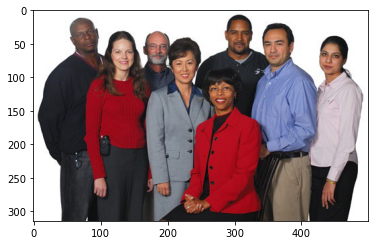

In [6]:
plt.imshow(image)
plt.show()

## Skin detection

### RGB - First approach

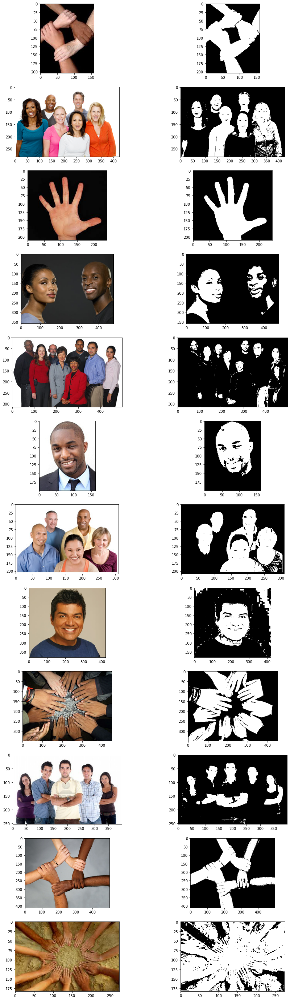

In [7]:
def first_skin_detector_rgb(pixel):
    red = pixel[0]
    green = pixel[1]
    blue = pixel[2]
    if (max([red, green, blue]) - min([red, green, blue]) > 15) and \
        red > 95 and \
        green > 40 and \
        blue > 20 and \
        abs(red - green) > 15 and \
        red > green and \
        red > blue:
        return True
    return False

def detect_skin_given_img_matrix(image, pixel_skin_detector): 
    image_modified = np.zeros(shape = image.shape)
    for i in range(len(image)):
        for j in range(len(image[0])):
            if pixel_skin_detector(image[i][j]):
                image_modified[i][j][0] = 255
                image_modified[i][j][1] = 255
                image_modified[i][j][2] = 255
            else:
                continue
                
    return image_modified
        

def visualize_results(pixel_skin_detector, rgb=True, hsv=False):
    fig, ax = plt.subplots(24,1,figsize=(15,50))
    images = [filename for filename in os.listdir('./test_images') if '.' in filename]

    index_plot = 1
    for i in range(len(images)):
        image_name = images[i]
        image_filename = './test_images/' + image_name
        
        plt.subplot(12,2,index_plot)
        if rgb == True:
            image = img.imread(image_filename)
        if hsv == True: 
            image = cv2.imread(image_filename)  # the image is read in BGR format
            hsvImage = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
            image = hsvImage.copy()
            
        plt.imshow(np.uint8(image))

        plt.subplot(12,2,index_plot + 1)
        plt.imshow(np.uint8(detect_skin_given_img_matrix(image, pixel_skin_detector)))
        index_plot += 2

    plt.show()

visualize_results(first_skin_detector_rgb)

### RGB - Second approach

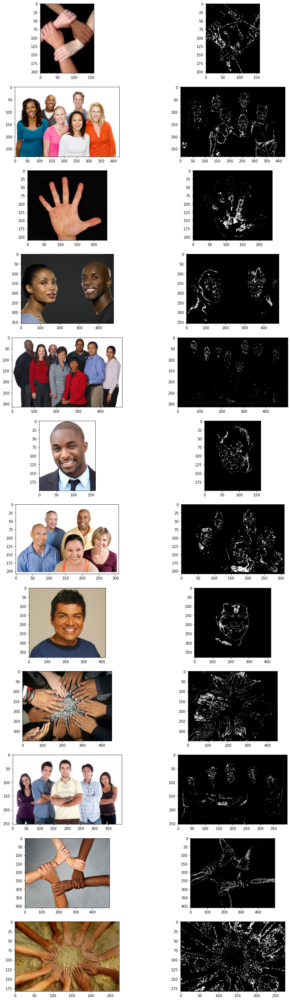

In [8]:
def second_skin_detector_rgb(pixel):
    red = pixel[0]
    green = pixel[1]
    blue = pixel[2]
    if (float(red) / green > 1.185) and (float(red * blue) / (red + green + blue)**2 > 0.107) and \
        (float(red * green) / (red + green + blue)**2 > 0.112):
        return True
    return False

visualize_results(second_skin_detector_rgb)

### HSV - First approach

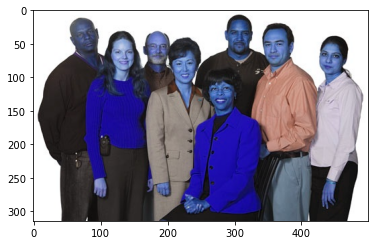

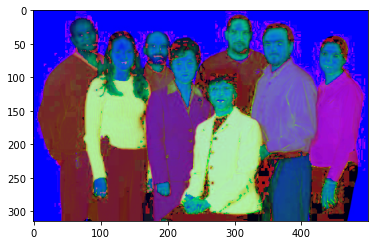

In [9]:
image = './test_images/4.jpg'
image = cv2.imread(image)  # the image is read in BGR format
hsvImage = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

plt.imshow(image)
plt.show()
plt.imshow(hsvImage)
plt.show()

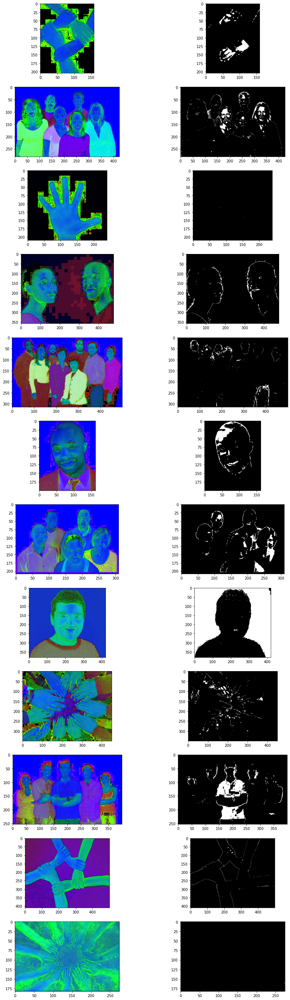

In [10]:
def first_skin_detector_hsv(pixel):
    hue = pixel[0]
    saturation = pixel[1] / 100
    value = pixel[2] / 100
    if (value >= 0.4) and (0.2 < saturation < 0.6) and (0 < hue < 25 or 335 < hue <= 360):
        return True
    return False

visualize_results(first_skin_detector_hsv, rgb=False, hsv=True)

### HSV - Second approach

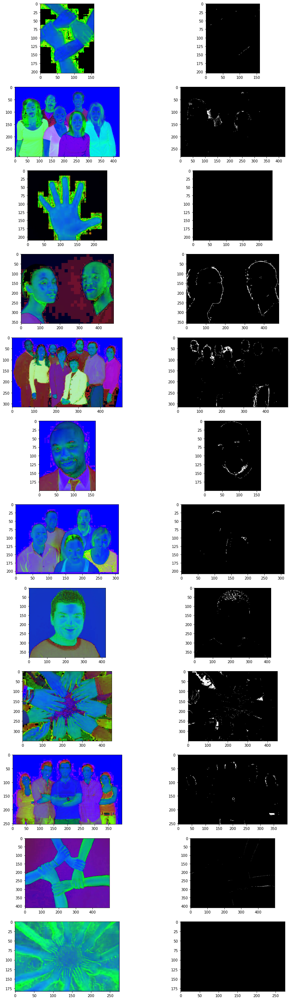

In [11]:
def second_skin_detector_hsv(pixel):
    hue = pixel[0]
    saturation = pixel[1] / 100
    value = pixel[2] / 100
    if (hue <= 50) and (0.23 <= saturation <= 0.68) and (0.35 <= value <= 1):
        return True
    return False

visualize_results(second_skin_detector_hsv, rgb=False, hsv=True)

### HSV - Third approach

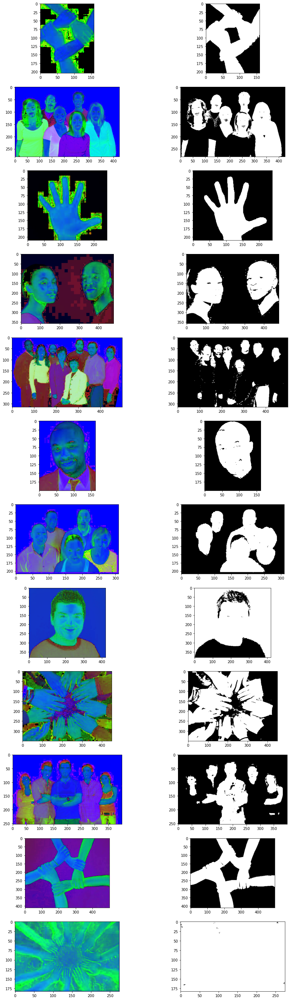

In [12]:
def third_skin_detector_hsv(pixel):
    hue = pixel[0]
    saturation = pixel[1] / 100
    value = pixel[2] / 100
    if (value >= 0.35) and (saturation >= 0.2) and (0 <= hue <= 50 or 340 <= hue <= 360):
        return True
    return False

visualize_results(third_skin_detector_hsv, rgb=False, hsv=True)

### Y,Cb,Cr - First approach

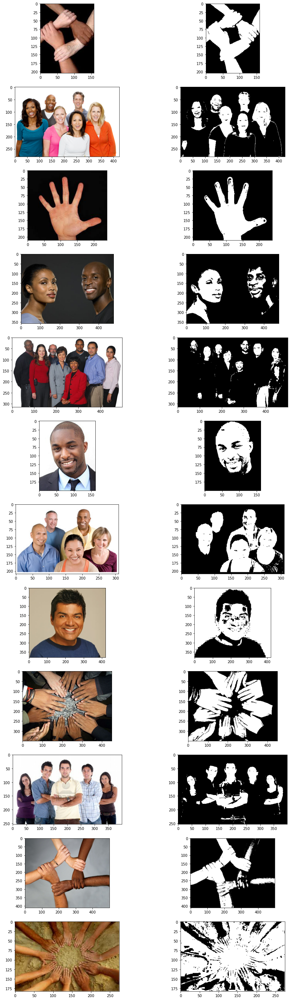

In [13]:
def first_skin_detector_ycbcr(pixel):
    red = pixel[0]
    green = pixel[1] 
    blue = pixel[2]
    
    # pixel conversion from RGB to (Y, Cb, Cr)
    Y = 0.299 * red + 0.587 * green + 0.114 * blue
    Cb = (-1) * 0.1687 * red - 0.3313 * green + 0.5 * blue + 128
    Cr = 0.5 * red - 0.4187 * green - 0.0813 * blue + 128
    
    if Y > 80 and (85 < Cb < 135) and (135 < Cr < 180):
        return True
    return False

visualize_results(first_skin_detector_ycbcr, rgb=True, hsv=False)

### Y,Cb,Cr - Second approach

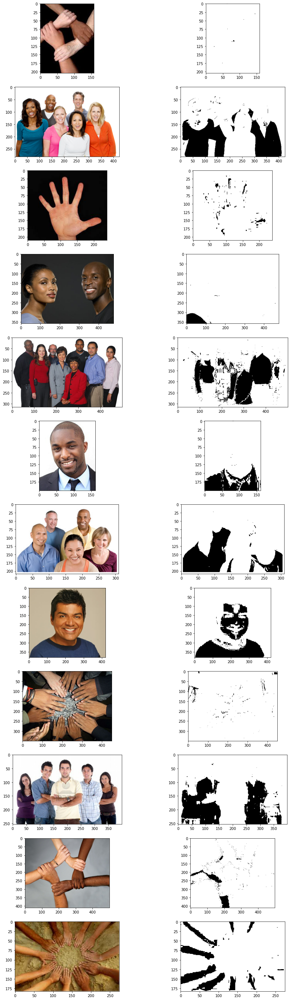

In [14]:
def second_skin_detector_ycbcr(pixel):
    red = pixel[0]
    green = pixel[1]
    blue = pixel[2] 
    
    # pixel conversion from RGB to (Y, Cb, Cr)
    Y = 0.299 * red + 0.587 * green + 0.114 * blue
    Cb = (-1) * 0.1687 * red - 0.3313 * green + 0.5 * blue + 128
    Cr = 0.5 * red - 0.4187 * green - 0.0813 * blue + 128
    
    if  Cr <= (1.5862 * Cb + 20) and \
        Cr >= (0.3448 * Cb + 76.2069) and \
        Cr >= ((-1) * 4.5652 * Cb + 234.5652) and \
        Cr <= ((-1) * 1.15 * Cb + 301.75) and \
        Cr <= ((-1) * 2.2857 * Cb + 432.85):
        return True
    return False

visualize_results(second_skin_detector_ycbcr, rgb=True, hsv=False)

## Face detection in portret photos using skin pixels detection

In [15]:
def get_indexes_for_square_face(image, pixel_skin_detector): 
    image_modified = np.zeros(shape = image.shape)
    y_face_start = None
    y_face_stop = None
    x_face_start = None
    x_face_stop = None
    
    for i in range(len(image)):
        pixels_skin_found = False
        for j in range(len(image[0])):
            if pixel_skin_detector(image[i][j]):
                pixels_skin_found = True
                if y_face_start == None:
                    y_face_start = i
                    x_face_start = j
                # we need to found the most left sided x coord 
                if x_face_start != None and j < x_face_start:
                    x_face_start = j
            else:
                if x_face_start != None:
                    if x_face_stop == None:
                        x_face_stop = j
                        break
                    # we need to found the most right sided x coord 
                    if j != 0:
                        if x_face_stop != None and j > x_face_stop and pixel_skin_detector(image[i][j-1]):
                            x_face_stop = j
                            break
        if pixels_skin_found == False and y_face_start != None and y_face_stop == None:
            y_face_stop = i 
    
    # in case the skin pixels are present as well on the last line 
    if y_face_stop == None:
        y_face_stop = len(image) - 1
    if x_face_stop == None:
        x_face_stop = len(image[0]) - 1
                
    return x_face_start, x_face_stop, y_face_start, y_face_stop

In [16]:
image_filename = './test_images/5.jpg'
image = img.imread(image_filename)

x_face_start, x_face_stop, y_face_start, y_face_stop = get_indexes_for_square_face(image, first_skin_detector_rgb)
x_face_start, x_face_stop, y_face_start, y_face_stop

(32, 139, 2, 157)

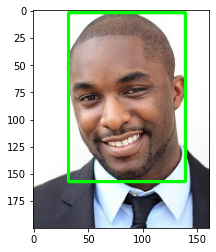

In [17]:
cv2.rectangle(image, (x_face_start, y_face_start), (x_face_stop, y_face_stop), (0, 255, 0), 2) 
plt.imshow(image)
plt.show()

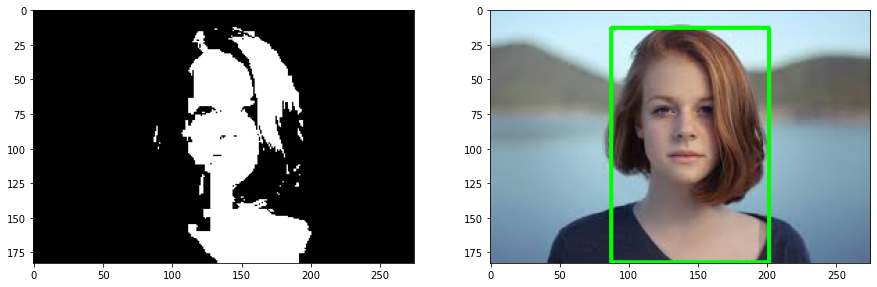

In [18]:
def detect_face_in_portrait(image_filename):
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,8))

    image = img.imread(image_filename)
    x_face_start, x_face_stop, y_face_start, y_face_stop = get_indexes_for_square_face(image, first_skin_detector_rgb)
    
    ax1.imshow(np.uint8(detect_skin_given_img_matrix(image, first_skin_detector_rgb)))
    
    cv2.rectangle(image, (x_face_start, y_face_start), (x_face_stop, y_face_stop), (0, 255, 0), 2) 
    ax2.imshow(image)
    
    plt.show()
    
detect_face_in_portrait('./test_images/portraits/portrait1.jpg')

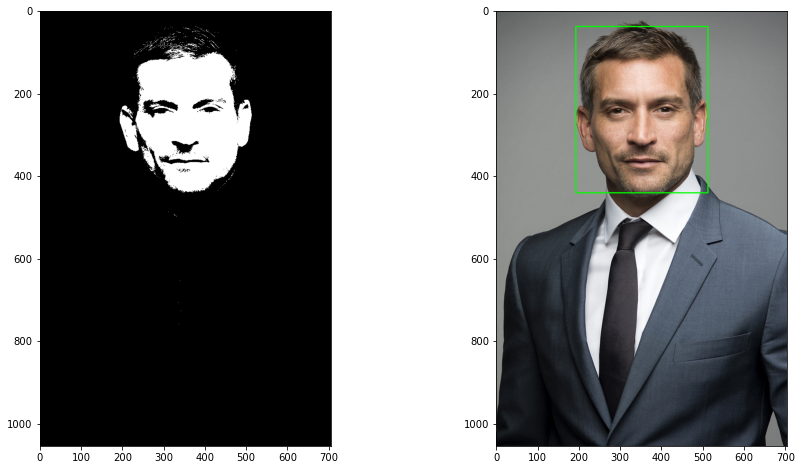

In [19]:
detect_face_in_portrait('./test_images/portraits/portrait2.jpg')

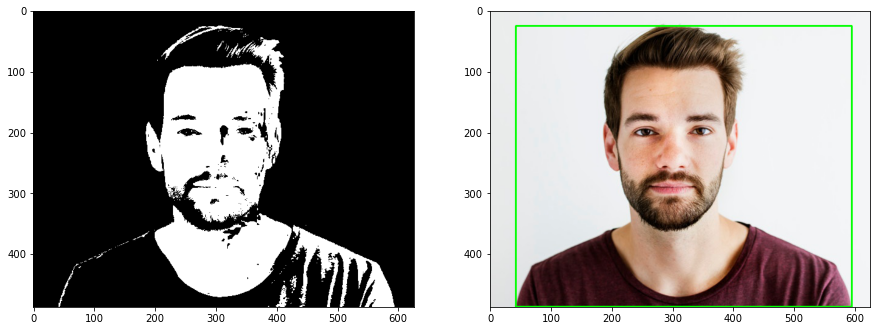

In [20]:
detect_face_in_portrait('./test_images/portraits/portrait3.jpg')

## Pictures that show more than a thousand words

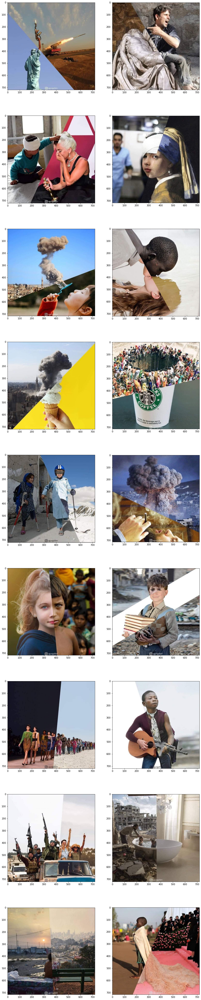

In [30]:
fig, ax = plt.subplots(18,1,figsize=(15,80))

index_plot = 1
for file in os.listdir('./test_images/parallel worlds/'):
    plt.subplot(9,2,index_plot)
    image = img.imread('./test_images/parallel worlds/' + file)
    plt.imshow(np.uint8(image))
    index_plot += 1
    
plt.show()